<a href="https://colab.research.google.com/github/arthurpalmeira/coins/blob/main/IDENT_COINS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Instalando as dependências

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd /content/yolov5
!pwd
!ls
# Instala as dependêncies necessárias
!pip install -qr requirements.txt
!pip install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu116
import torch
from IPython.display import Image, clear_output  # p exibir imagens
import utils

Cloning into 'yolov5'...
remote: Enumerating objects: 12896, done.
remote: Counting objects: 100% (71/71), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 12896 (delta 41), reused 63 (delta 38), pack-reused 12825
Receiving objects: 100% (12896/12896), 12.40 MiB | 10.82 MiB/s, done.
Resolving deltas: 100% (8868/8868), done.
/content/yolov5
/content/yolov5
CONTRIBUTING.md  export.py   models	       setup.cfg       utils
data		 hubconf.py  README.md	       train.py        val.py
detect.py	 LICENSE     requirements.txt  tutorial.ipynb
     |████████████████████████████████| 596 kB 4.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/, https://download.pytorch.org/whl/cu116


In [ ]:
# Clona o repositorio que contém o dataset
!git clone https://github.com/arthurpalmeira/coins.git
from google.colab import drive
drive.mount('/content/drive')

Cloning into 'coins'...
remote: Enumerating objects: 1573, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 1573 (delta 0), reused 0 (delta 0), pack-reused 1570
Receiving objects: 100% (1573/1573), 1.49 GiB | 14.23 MiB/s, done.
Checking out files: 100% (1915/1915), done.
Mounted at /content/drive


In [ ]:
%cd /content/yolov5/coins
!ls
%cat data_set.yaml

/content/yolov5/coins
data_set.yaml  Images
train: /content/yolov5/coins/Images/train # train images 
val: /content/yolov5/coins/Images/val  # val images 
test: /content/yolov5/coins/Images/test  # test 
# Classes
nc: 5  # number of classes
names: ['10','05','25','50','100']  # class names


In [ ]:
# Customiza o iPython para alterar a variável número de classes
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
# Cria arquivo de configuração do modelo a partir com base no yolov5l.yaml
%%writetemplate /content/yolov5/models/custom_yolov5m.yaml

# Parameters
nc: 5  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
# Treinamento com custom_yolov5m para 100 epochs
# tempo seu desempenho
%%time
%cd /content/yolov5/
!python train.py --img 800 --batch 5 --epochs 100 --data /content/yolov5/coins/data_set.yaml --cfg /content/yolov5/models/custom_yolov5m.yaml --weights ''  --name /content/yoolov5/ --cache

/content/yolov5
train: weights=, cfg=/content/yolov5/models/custom_yolov5m.yaml, data=/content/yolov5/coins/data_set.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=5, imgsz=800, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=/content/yoolov5/, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-308-g602d7ff Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0

In [ ]:
# Cria os diretórios
#!mkdir -p /content/drive/MyDrive/TAI1/PROJETO/yolov5x_100ep
%cp -r /content/yoolov5 /content/drive/MyDrive/TAI1/PROJETO/yolov5m_100ep

In [ ]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir /content/yoolov5

<IPython.core.display.Javascript object>

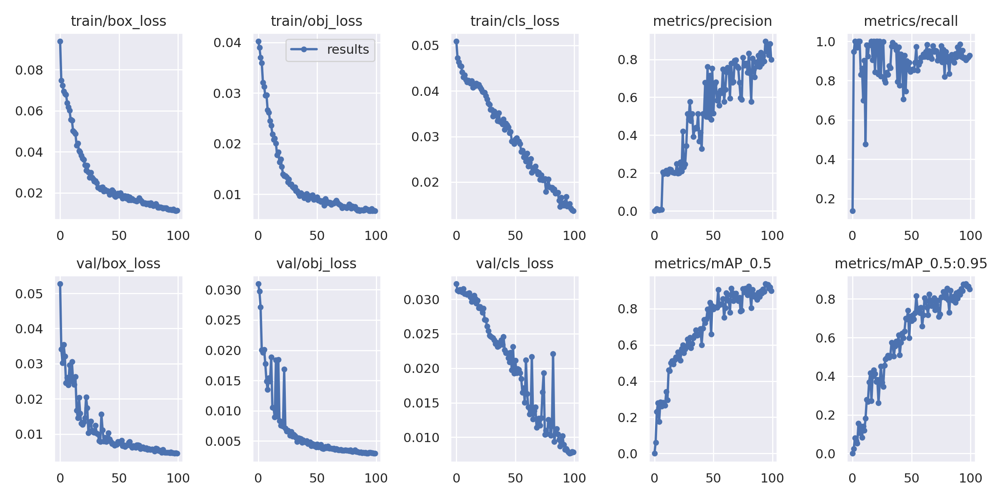

In [ ]:
# Gráficos referentes ao treinamento
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yoolov5/results.png', width=800)  # view results.png

IMAGENS DE TREINO COM AS CLASSES


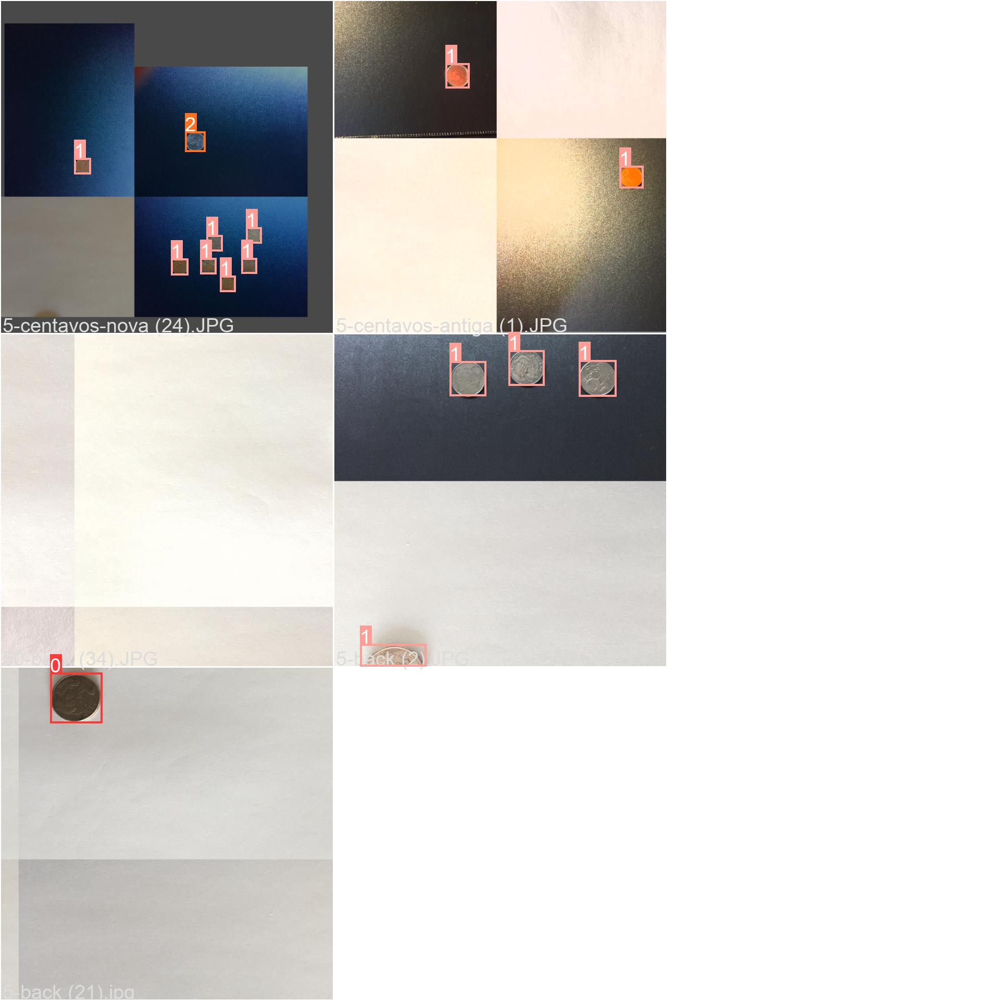

In [ ]:
print("IMAGENS DE TREINO COM AS CLASSES")
Image(filename='/content/yoolov5/train_batch0.jpg', width= 1300)

IMAGENS DE VALIDAÇÃO COM OS LABELS


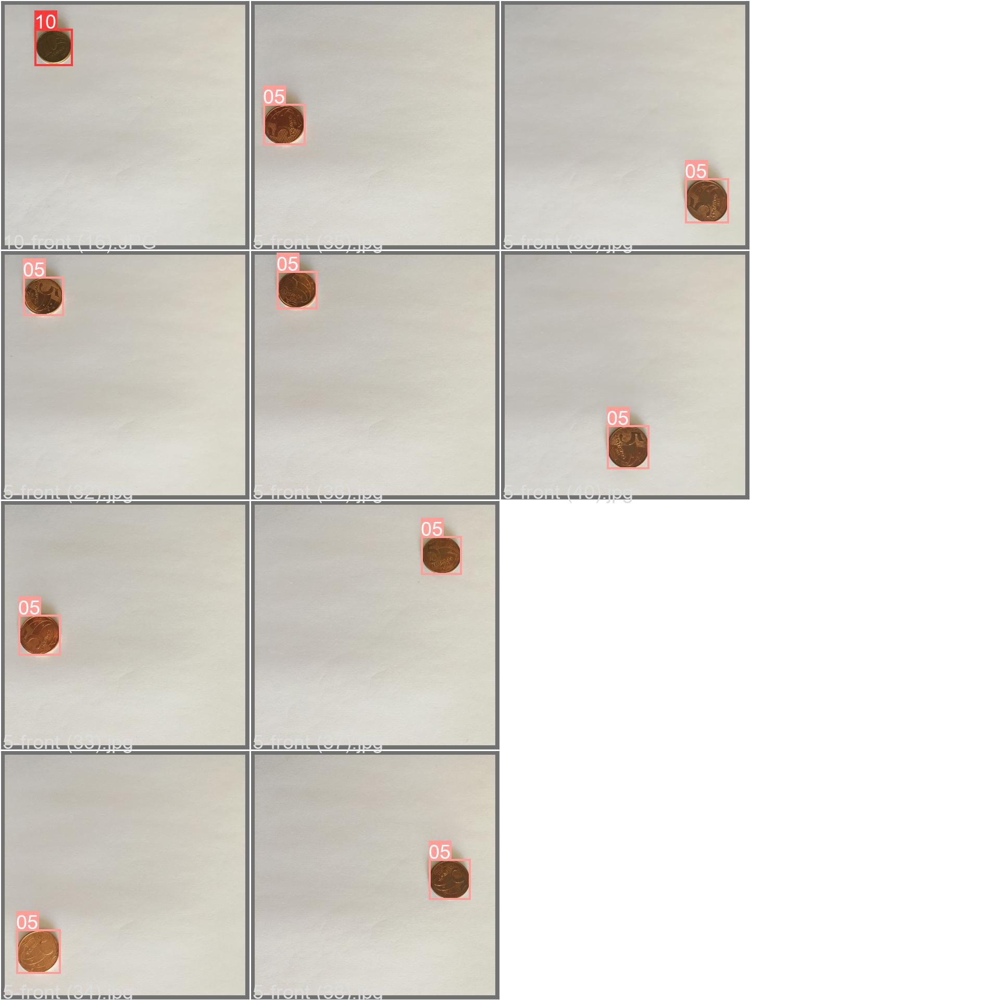

In [ ]:
print("IMAGENS DE VALIDAÇÃO COM OS LABELS")
Image(filename='/content/yoolov5/val_batch0_labels.jpg', width=1300)

PREDIÇÕES EM IMAGENS DE VALIDAÇÃO


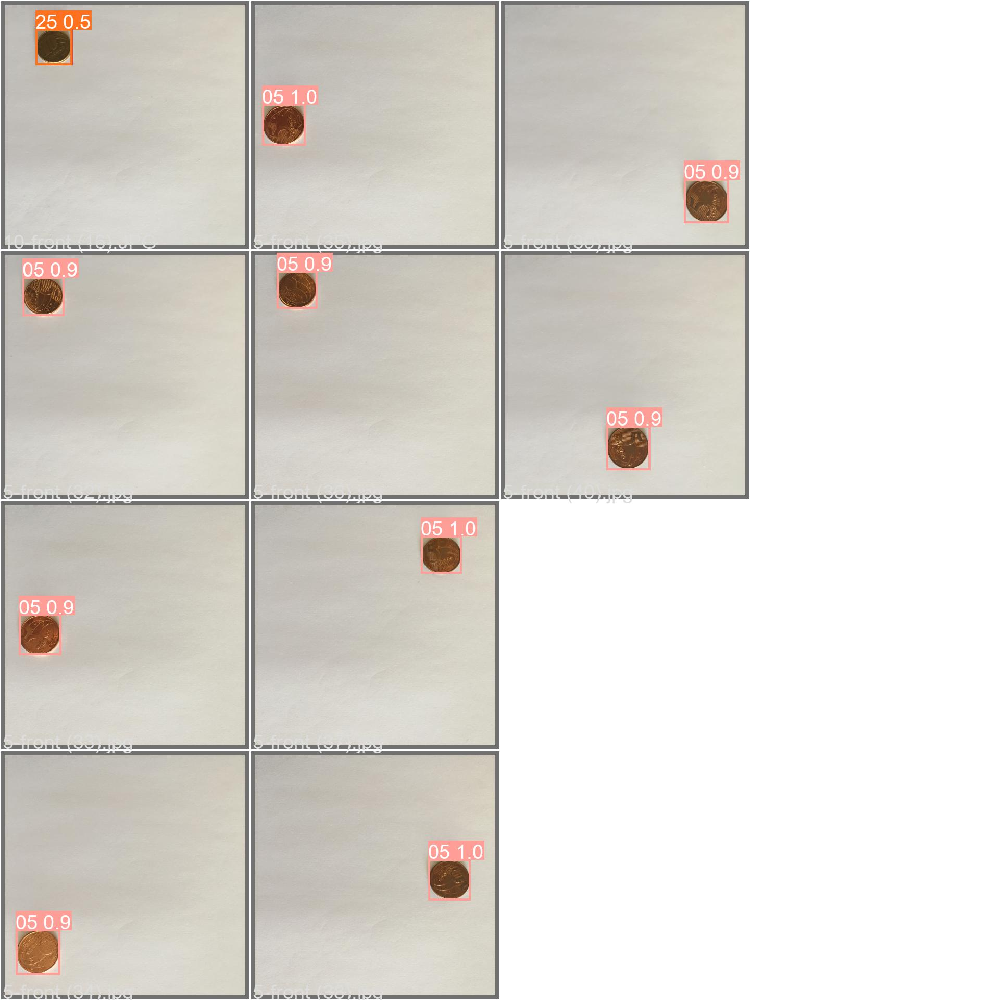

In [ ]:
print("PREDIÇÕES EM IMAGENS DE VALIDAÇÃO")
Image(filename='/content/yoolov5/val_batch0_pred.jpg', width=1300)

In [ ]:
# A inferência é executada em  0.8ms pre-process, 17.3ms inference, 1.0ms NMS per image at shape (1, 3, 800, 800) em um Tesla P100-PCIE-16GB
%%time
%cd /content/yolov5/
!python detect.py --weights /content/yoolov5/weights/best.pt  --img 800 --conf 0.4 --source '/content/yolov5/coins/Images/test' --data /content/yolov5/coins/data_set.yaml --name /content/yolov5/runs/detect

/content/yolov5
detect: weights=['/content/yoolov5/weights/best.pt'], source=/content/yolov5/coins/Images/test, data=/content/yolov5/coins/data_set.yaml, imgsz=[800, 800], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=/content/yolov5/runs/detect, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-308-g602d7ff Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5m summary: 290 layers, 20869098 parameters, 0 gradients, 47.9 GFLOPs
image 1/92 /content/yolov5/coins/Images/test/10-centavos-nova (36).JPG: 608x800 1 10, Done. (0.014s)
image 2/92 /content/yolov5/coins/Images/test/10-centavos-nova (37).JPG: 608x800 1 10, Done. (0.014s)
image 3/92 /content/yolov5/coins/Images/test/10-centavos-nova (

IMAGEM DE INFERÊNCIA COM LABELS


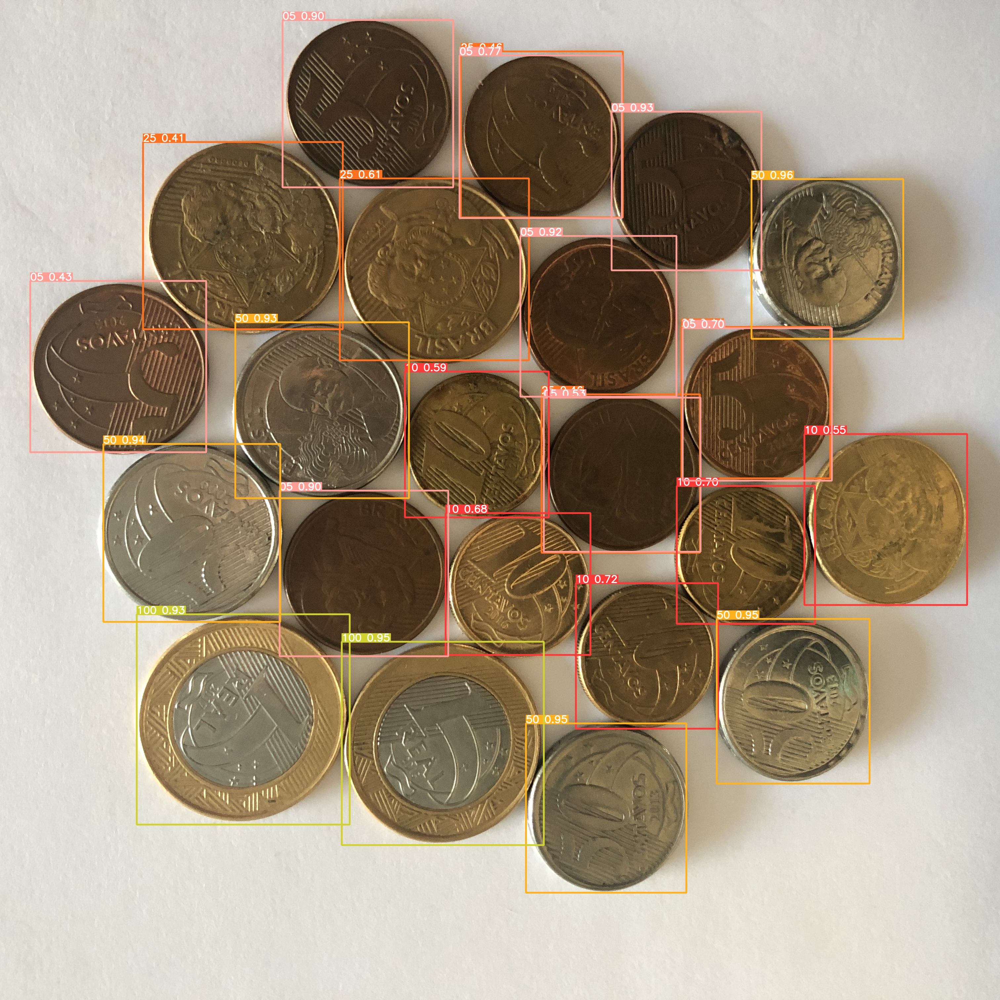

In [ ]:
print("IMAGEM DE INFERÊNCIA COM LABELS")
Image(filename='/content/yolov5/runs/detect/10front-10front-5back-5back-100front-100front-50front-50back-25back-25back-5back-5front-10front-10front-5front-5front-5f-50b-50f-50f-25b-5f.jpg', width=800)

IMAGEM DE INFERÊNCIA COM LABELS


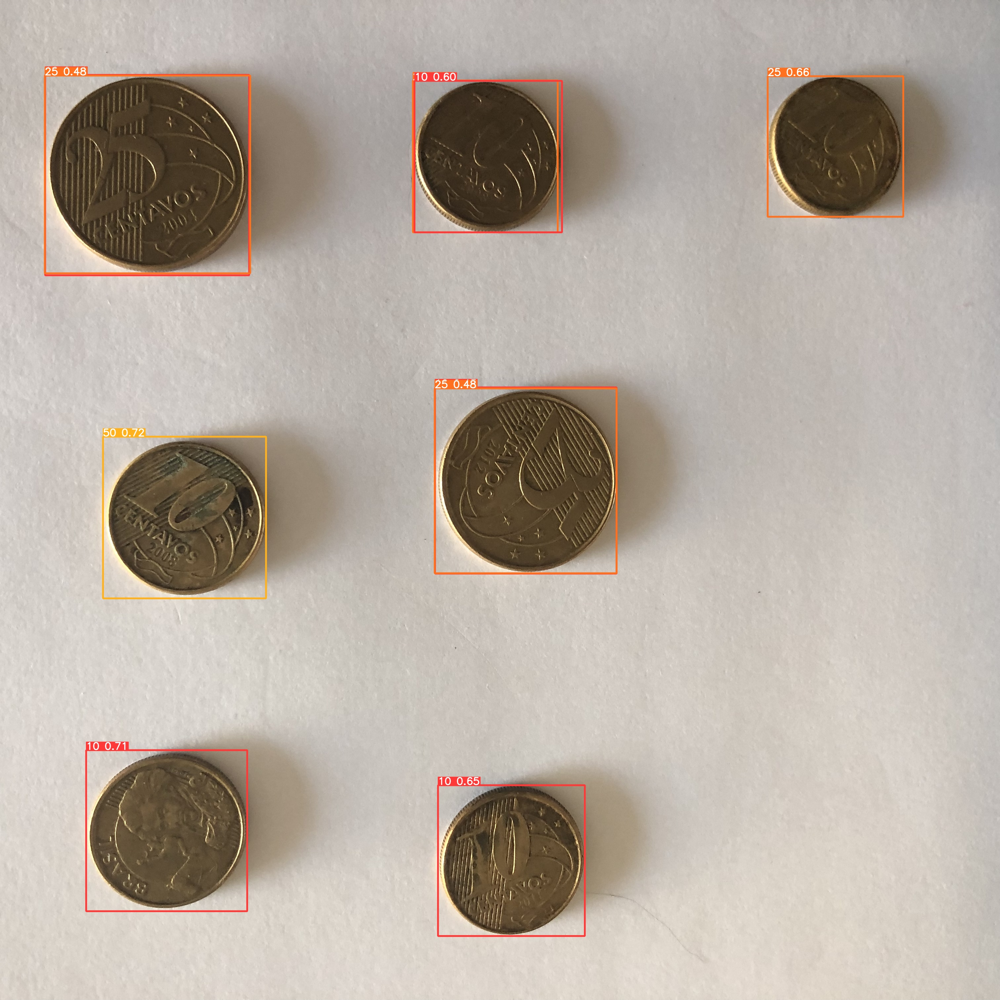

In [22]:
print("IMAGEM DE INFERÊNCIA COM LABELS")
Image(filename='/content/yolov5/runs/detect/25front-10front-10back-10front-25front-10front-10front.jpg', width=800)

In [23]:
%cp -r /content/yolov5/runs/detect /content/drive/MyDrive/TAI1/PROJETO/yolov5m_100ep

MATRIZ DE CONFUSÃO


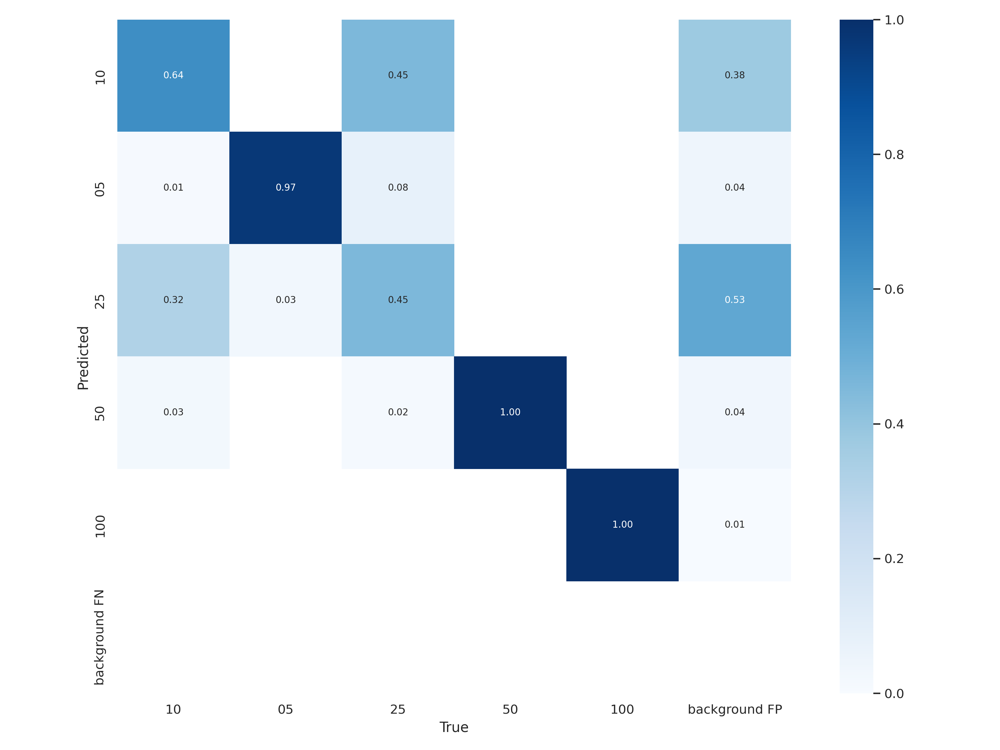

In [24]:
print("MATRIZ DE CONFUSÃO")
Image(filename='/content/yoolov5/confusion_matrix.png', width=1000)